In [1]:
import pandas as pd
import numpy as np

In [2]:
articles = pd.read_csv('data/articles_data.csv')

In [3]:
articles.head()

,id,index,timestamp,eventType,contentId,authorPersonId,authorSessionId,authorUserAgent,authorRegion,authorCountry,contentType,url,title,text,lang,total_events
0,0,3096,1487246811,CONTENT SHARED,-4029704725707465084,6013226412048763966,-6569695881431984742,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,SP,BR,HTML,http://www.cnbc.com/2016/12/21/former-google-c...,former google career coach shares a visual tri...,"If you want 2017 to be an exciting year, desig...",en,433
1,1,1671,1467813728,CONTENT SHARED,-133139342397538859,4918484843075254252,-5701227433817087697,NaN,NaN,NaN,HTML,http://gq.globo.com/Prazeres/Poder/Carreira/no...,"novo workaholic trabalha, pratica esportes e t...",Novo workaholic não abre mão do esporte e da f...,pt,315
2,2,1814,1468867647,CONTENT SHARED,-6783772548752091658,4918484843075254252,-8995217520473210153,NaN,NaN,NaN,HTML,http://www.caroli.org/livro-retrospectivas-div...,livro: retrospectivas divertidas,"Neste livro, nós fornecemos um conjunto de fer...",pt,294
3,3,1317,1465484901,CONTENT SHARED,8657408509986329668,-8020832670974472349,838596071610016700,NaN,NaN,NaN,HTML,https://medium.com/practical-blend/pull-reques...,pull request first - practical blend,Pull request first After two years of working ...,en,294
4,4,588,1461629452,CONTENT SHARED,-6843047699859121724,7527226129639571966,-1297230017812472163,NaN,NaN,NaN,HTML,https://medium.com/@jeffersoncn/ganhe-6-meses-...,"ganhe 6 meses de acesso ao pluralsight, maior ...","Ganhe 6 meses de acesso ao Pluralsight, maior ...",pt,281


In [4]:
articles = articles.sort_values(['total_events'], ascending=[False])

In [5]:
articles.head()

,id,index,timestamp,eventType,contentId,authorPersonId,authorSessionId,authorUserAgent,authorRegion,authorCountry,contentType,url,title,text,lang,total_events
0,0,3096,1487246811,CONTENT SHARED,-4029704725707465084,6013226412048763966,-6569695881431984742,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,SP,BR,HTML,http://www.cnbc.com/2016/12/21/former-google-c...,former google career coach shares a visual tri...,"If you want 2017 to be an exciting year, desig...",en,433
1,1,1671,1467813728,CONTENT SHARED,-133139342397538859,4918484843075254252,-5701227433817087697,NaN,NaN,NaN,HTML,http://gq.globo.com/Prazeres/Poder/Carreira/no...,"novo workaholic trabalha, pratica esportes e t...",Novo workaholic não abre mão do esporte e da f...,pt,315
2,2,1814,1468867647,CONTENT SHARED,-6783772548752091658,4918484843075254252,-8995217520473210153,NaN,NaN,NaN,HTML,http://www.caroli.org/livro-retrospectivas-div...,livro: retrospectivas divertidas,"Neste livro, nós fornecemos um conjunto de fer...",pt,294
3,3,1317,1465484901,CONTENT SHARED,8657408509986329668,-8020832670974472349,838596071610016700,NaN,NaN,NaN,HTML,https://medium.com/practical-blend/pull-reques...,pull request first - practical blend,Pull request first After two years of working ...,en,294
4,4,588,1461629452,CONTENT SHARED,-6843047699859121724,7527226129639571966,-1297230017812472163,NaN,NaN,NaN,HTML,https://medium.com/@jeffersoncn/ganhe-6-meses-...,"ganhe 6 meses de acesso ao pluralsight, maior ...","Ganhe 6 meses de acesso ao Pluralsight, maior ...",pt,281


In [6]:
articles.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3047 entries, 0 to 3046
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   id               3047 non-null   int64 
 1   index            3047 non-null   int64 
 2   timestamp        3047 non-null   int64 
 3   eventType        3047 non-null   object
 4   contentId        3047 non-null   int64 
 5   authorPersonId   3047 non-null   int64 
 6   authorSessionId  3047 non-null   int64 
 7   authorUserAgent  669 non-null    object
 8   authorRegion     669 non-null    object
 9   authorCountry    669 non-null    object
 10  contentType      3047 non-null   object
 11  url              3047 non-null   object
 12  title            3047 non-null   object
 13  text             3047 non-null   object
 14  lang             3047 non-null   object
 15  total_events     3047 non-null   int64 
dtypes: int64(7), object(9)
memory usage: 404.7+ KB


In [7]:
articles.isnull().sum()

id                    0
index                 0
timestamp             0
eventType             0
contentId             0
authorPersonId        0
authorSessionId       0
authorUserAgent    2378
authorRegion       2378
authorCountry      2378
contentType           0
url                   0
title                 0
text                  0
lang                  0
total_events          0
dtype: int64

In [8]:
#Creating some column to know the words  distribution

articles["heading_len"]=articles["title"].apply(lambda x:len(x))

#Counting words
articles["word_count"]=articles["title"].apply(lambda x:(len(x.split())))

In [9]:
# Function for getting average word lenghth

def get_avg_word_len(x):

    words=x.split()
    word_len=0
    for word in words:
        word_len=word_len +len(word)
    return word_len/len(words)

In [10]:
articles["avg_word_len"]=articles["title"].apply(lambda x: get_avg_word_len(x))

In [11]:
articles.head()

,id,index,timestamp,eventType,contentId,authorPersonId,authorSessionId,authorUserAgent,authorRegion,authorCountry,contentType,url,title,text,lang,total_events,heading_len,word_count,avg_word_len
0,0,3096,1487246811,CONTENT SHARED,-4029704725707465084,6013226412048763966,-6569695881431984742,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,SP,BR,HTML,http://www.cnbc.com/2016/12/21/former-google-c...,former google career coach shares a visual tri...,"If you want 2017 to be an exciting year, desig...",en,433,91,17,4.411765
1,1,1671,1467813728,CONTENT SHARED,-133139342397538859,4918484843075254252,-5701227433817087697,NaN,NaN,NaN,HTML,http://gq.globo.com/Prazeres/Poder/Carreira/no...,"novo workaholic trabalha, pratica esportes e t...",Novo workaholic não abre mão do esporte e da f...,pt,315,78,12,5.583333
2,2,1814,1468867647,CONTENT SHARED,-6783772548752091658,4918484843075254252,-8995217520473210153,NaN,NaN,NaN,HTML,http://www.caroli.org/livro-retrospectivas-div...,livro: retrospectivas divertidas,"Neste livro, nós fornecemos um conjunto de fer...",pt,294,32,3,10.000000
3,3,1317,1465484901,CONTENT SHARED,8657408509986329668,-8020832670974472349,838596071610016700,NaN,NaN,NaN,HTML,https://medium.com/practical-blend/pull-reques...,pull request first - practical blend,Pull request first After two years of working ...,en,294,36,6,5.166667
4,4,588,1461629452,CONTENT SHARED,-6843047699859121724,7527226129639571966,-1297230017812472163,NaN,NaN,NaN,HTML,https://medium.com/@jeffersoncn/ganhe-6-meses-...,"ganhe 6 meses de acesso ao pluralsight, maior ...","Ganhe 6 meses de acesso ao Pluralsight, maior ...",pt,281,78,12,5.583333


In [12]:
import plotly as py
import cufflinks as cf

In [13]:
df_en = articles[articles['lang'] == 'en']  # English
df_pt = articles[articles['lang'] == 'pt']  # Portuguese

In [14]:
df_en.head()

,id,index,timestamp,eventType,contentId,authorPersonId,authorSessionId,authorUserAgent,authorRegion,authorCountry,contentType,url,title,text,lang,total_events,heading_len,word_count,avg_word_len
0,0,3096,1487246811,CONTENT SHARED,-4029704725707465084,6013226412048763966,-6569695881431984742,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,SP,BR,HTML,http://www.cnbc.com/2016/12/21/former-google-c...,former google career coach shares a visual tri...,"If you want 2017 to be an exciting year, desig...",en,433,91,17,4.411765
3,3,1317,1465484901,CONTENT SHARED,8657408509986329668,-8020832670974472349,838596071610016700,NaN,NaN,NaN,HTML,https://medium.com/practical-blend/pull-reques...,pull request first - practical blend,Pull request first After two years of working ...,en,294,36,6,5.166667
6,6,1902,1469678235,CONTENT SHARED,-8208801367848627943,-3390049372067052505,2045534933671019150,NaN,NaN,NaN,HTML,http://www.geekwire.com/2016/ray-kurzweil-worl...,ray kurzweil: the world isn't getting worse - ...,"Ray Kurzweil, the author, inventor, computer s...",en,266,79,13,5.153846
7,7,1942,1469992520,CONTENT SHARED,2581138407738454418,6756039155228175109,611377856408166257,NaN,NaN,NaN,HTML,https://medium.com/@rdsubhas/10-modern-softwar...,10 modern software over-engineering mistakes,10 Modern Software Over-Engineering Mistakes F...,en,255,44,5,8.000000
11,11,1162,1464708954,CONTENT SHARED,2857117417189640073,22763587941636338,8000922562339244508,NaN,NaN,NaN,HTML,https://sprintstories.com/running-gv-sprints-i...,running gv sprints inside corporates - learn f...,Running GV sprints inside corporates - learn f...,en,241,78,13,5.076923


In [15]:
print(df_en.shape)
print(df_pt.shape)

(2211, 19)
(829, 19)


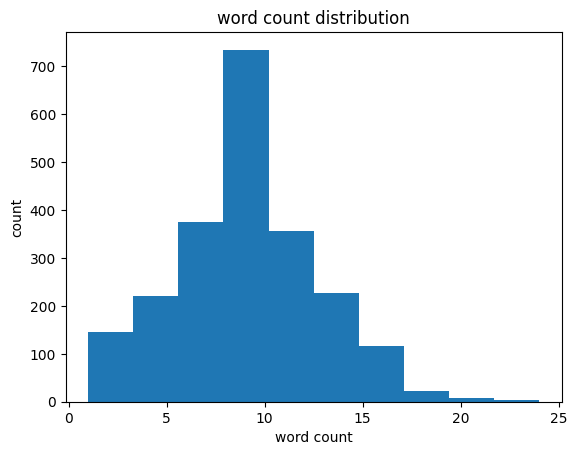

In [16]:
import matplotlib.pyplot as plt

plt.hist(df_en["word_count"])
plt.xlabel("word count")
plt.ylabel("count")
plt.title("word count distribution")
plt.show()

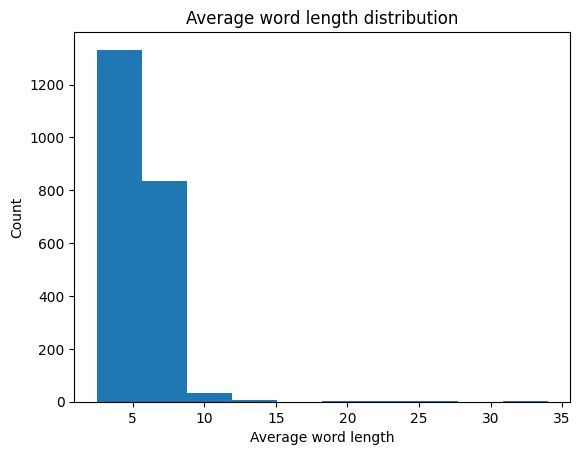

In [17]:
#Visualizing average word length

plt.hist(df_en["avg_word_len"])
plt.xlabel("Average word length")
plt.ylabel("Count")
plt.title("Average word length distribution")
plt.show()

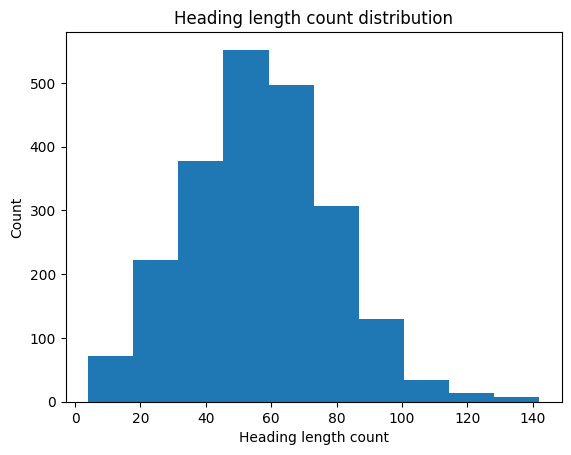

In [18]:
# Visualizing length of heading distribution

plt.hist(df_en["heading_len"])
plt.xlabel("Heading length count")
plt.ylabel("Count")
plt.title("Heading length count distribution")
plt.show()

In [19]:
 # converting heading column to lower case

df_en["title"].str.lower()

0       former google career coach shares a visual tri...
3                    pull request first - practical blend
6       ray kurzweil: the world isn't getting worse - ...
7            10 modern software over-engineering mistakes
11      running gv sprints inside corporates - learn f...
                              ...                        
3006    ibm wants to "evolve the internet" with blockc...
3007    how http/2 is changing web performance best pr...
3008                                hidden (caché) (2005)
3009    google sprints ahead in ai building blocks, le...
3046    ibm is now letting anyone play with its quantu...
Name: title, Length: 2211, dtype: object

In [20]:
#converting heading column to lower case

df_en["text"].str.lower()

0       if you want 2017 to be an exciting year, desig...
3       pull request first after two years of working ...
6       ray kurzweil, the author, inventor, computer s...
7       10 modern software over-engineering mistakes f...
11      running gv sprints inside corporates - learn f...
                              ...                        
3006    the aite group projects the blockchain market ...
3007    this post is part one of a two-part series det...
3008    26 wins & 32 nominations. see more awards " st...
3009    there's a high-stakes race under way in silico...
3046    quantum computing is computing at its most eso...
Name: text, Length: 2211, dtype: object

In [21]:
import re
import nltk
import string,time

In [22]:
#Tag Removing Function (for safety purpose)

def remove_tags(text):
    pattern=re.compile("<.-*?>")
    return pattern.sub(r'',text)

In [23]:
#Tag Removal operation

df_en['title']=df_en['title'].apply(remove_tags)

df_en["text"]=df_en["text"].apply(remove_tags)

df_en["title"]

0       former google career coach shares a visual tri...
3                    pull request first - practical blend
6       ray kurzweil: the world isn't getting worse - ...
7            10 modern software over-engineering mistakes
11      running gv sprints inside corporates - learn f...
                              ...                        
3006    ibm wants to "evolve the internet" with blockc...
3007    how http/2 is changing web performance best pr...
3008                                hidden (caché) (2005)
3009    google sprints ahead in ai building blocks, le...
3046    ibm is now letting anyone play with its quantu...
Name: title, Length: 2211, dtype: object

In [24]:
#Getting all the punctuation
punctuation=string.punctuation

In [25]:
# Implementing String Removing
def remove_punc(text):

    return  text.translate(str.maketrans('','',punctuation))

In [26]:
df_en['title']=df_en['title'].apply(remove_punc)

df_en["text"]=df_en["text"].apply(remove_punc)

In [27]:
df_en["title"]

0       former google career coach shares a visual tri...
3                     pull request first  practical blend
6       ray kurzweil the world isnt getting worse  our...
7             10 modern software overengineering mistakes
11      running gv sprints inside corporates  learn fr...
                              ...                        
3006    ibm wants to evolve the internet with blockcha...
3007    how http2 is changing web performance best pra...
3008                                    hidden caché 2005
3009    google sprints ahead in ai building blocks lea...
3046    ibm is now letting anyone play with its quantu...
Name: title, Length: 2211, dtype: object

In [28]:
#Example of Stemming
from nltk.stem import PorterStemmer
porter = PorterStemmer()
porter.stem('dancing')

# porter.stem('running')  o/p- run
#it used for finding root word

'danc'

In [29]:
# import nltk
# nltk.download('omw-1.4')
# nltk.download('wordnet')

In [30]:
#Stemming

def stem(text):
    lst=[]
    for i in text.split():
        lst.append(ps.stem(i))
    return " ".join(lst)

In [31]:
df_en["title"]=df_en["title"].apply(lambda x:x.lower())

In [32]:
from sklearn.feature_extraction.text import CountVectorizer

cv=CountVectorizer(max_features=5000,stop_words="english")

In [35]:
import pickle
# pickle.dump(cv,open('cv','wb'))

In [36]:
cv = pickle.load(open('cv','rb'))

In [37]:
# Converting headings into array
vectors_en=cv.fit_transform(df_en["title"]).toarray()

In [38]:
#Getting shape of vector
vectors_en.shape

(2211, 4800)

In [39]:
vectors_en

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [40]:
import ast
from sklearn.metrics.pairwise import cosine_similarity
from textblob import TextBlob
from nltk.tokenize import word_tokenize,sent_tokenize

In [41]:
# Finding most commonly used 5000 words in our corpus

feature_names_en = cv.get_feature_names_out()

In [42]:
feature_names_en

array(['08', '10', '100', ..., 'zuckerberg', 'zuul', 'ŷhat'], dtype=object)

In [43]:
#Finding similarity between vectors

similarity_en=cosine_similarity(vectors_en)

In [44]:
# Acessing other similar element to "5th heading"
similarity_en[5]

array([0., 0., 0., ..., 0., 0., 0.])

In [45]:
df_en['title'][0]

'former google career coach shares a visual trick for figuring out what to do with your life'

### Another dataset

In [46]:
df=pd.read_csv("7k  Unique crime articles.csv")

In [47]:
df

,heading,content_summary,article_link,img_link,month_date,time,Year
0,"Uttarakhand: Man, 39, held for killing consta...",Nainital district police on Monday arrested a...,https://timesofindia.indiatimes.com/city/dehra...,https://static.toiimg.com/thumb/imgsize-123456...,Nov 08,09:55,2022
1,"Nashik city: Another theft from parked car, s...",Thefts from parked cars continues in the city...,https://timesofindia.indiatimes.com/city/nashi...,https://static.toiimg.com/thumb/imgsize-123456...,Nov 08,08:25,2022
2,Pune: Externed criminal jumps from bus fearin...,An externed criminal died in the early hours ...,https://timesofindia.indiatimes.com/city/pune/...,https://static.toiimg.com/thumb/imgsize-123456...,Nov 08,05:17,2022
3,Gaya woman burned alive on suspicion of witch...,A middle-aged woman was badly thrashed and bu...,https://timesofindia.indiatimes.com/city/patna...,https://static.toiimg.com/thumb/imgsize-123456...,Nov 06,05:24,2022
4,Man held on charge of stalking in Pune,A man (33) was arrested on Tuesday from Khed ...,https://timesofindia.indiatimes.com/city/pune/...,https://static.toiimg.com/thumb/imgsize-123456...,Nov 03,08:32,2022
...,...,...,...,...,...,...,...
7612,Mumbai: Borivli businessman duped of Rs 1 lak...,A smalltime businessman from Borivli was dupe...,https://timesofindia.indiatimes.com/city/mumba...,https://static.toiimg.com/thumb/imgsize-123456...,Jul 11,14:44,2020
7613,Former New York governor Cuomo accused of gro...,The filing from the Albany County Sheriff's O...,https://timesofindia.indiatimes.com/world/us/f...,https://static.toiimg.com/thumb/imgsize-123456...,Oct 29,"21, 0","29,"
7614,Delhi cop and neighbour injured in shooting; ...,A policeman and his neighbour were shot at by...,https://timesofindia.indiatimes.com/city/delhi...,https://static.toiimg.com/thumb/imgsize-123456...,Oct 06,10:32,2020
7615,Illegal granite mining in TN: ED tags assets ...,The Enforcement directorate (ED) has told the...,https://timesofindia.indiatimes.com/city/chenn...,https://static.toiimg.com/thumb/imgsize-123456...,Nov 10,04:39,2020


In [48]:
df.shape

(7617, 7)

In [49]:
df.head()

,heading,content_summary,article_link,img_link,month_date,time,Year
0,"Uttarakhand: Man, 39, held for killing consta...",Nainital district police on Monday arrested a...,https://timesofindia.indiatimes.com/city/dehra...,https://static.toiimg.com/thumb/imgsize-123456...,Nov 08,09:55,2022
1,"Nashik city: Another theft from parked car, s...",Thefts from parked cars continues in the city...,https://timesofindia.indiatimes.com/city/nashi...,https://static.toiimg.com/thumb/imgsize-123456...,Nov 08,08:25,2022
2,Pune: Externed criminal jumps from bus fearin...,An externed criminal died in the early hours ...,https://timesofindia.indiatimes.com/city/pune/...,https://static.toiimg.com/thumb/imgsize-123456...,Nov 08,05:17,2022
3,Gaya woman burned alive on suspicion of witch...,A middle-aged woman was badly thrashed and bu...,https://timesofindia.indiatimes.com/city/patna...,https://static.toiimg.com/thumb/imgsize-123456...,Nov 06,05:24,2022
4,Man held on charge of stalking in Pune,A man (33) was arrested on Tuesday from Khed ...,https://timesofindia.indiatimes.com/city/pune/...,https://static.toiimg.com/thumb/imgsize-123456...,Nov 03,08:32,2022


In [50]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7617 entries, 0 to 7616
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   heading          7617 non-null   object
 1   content_summary  7617 non-null   object
 2   article_link     7617 non-null   object
 3   img_link         7617 non-null   object
 4   month_date       7617 non-null   object
 5   time             7617 non-null   object
 6   Year             7617 non-null   object
dtypes: object(7)
memory usage: 416.7+ KB


In [51]:
#Handling Null Values
df.isnull().sum()

heading            0
content_summary    0
article_link       0
img_link           0
month_date         0
time               0
Year               0
dtype: int64

In [52]:
#Creating some column to know the words  distribution

df["heading_len"]=df["heading"].apply(lambda x:len(x))

#Counting words
df["word_count"]=df["heading"].apply(lambda x:(len(x.split())))

In [53]:
df["avg_word_len"]=df["heading"].apply(lambda x: get_avg_word_len(x))

In [54]:
df.head()

,heading,content_summary,article_link,img_link,month_date,time,Year,heading_len,word_count,avg_word_len
0,"Uttarakhand: Man, 39, held for killing consta...",Nainital district police on Monday arrested a...,https://timesofindia.indiatimes.com/city/dehra...,https://static.toiimg.com/thumb/imgsize-123456...,Nov 08,09:55,2022,69,10,5.800000
1,"Nashik city: Another theft from parked car, s...",Thefts from parked cars continues in the city...,https://timesofindia.indiatimes.com/city/nashi...,https://static.toiimg.com/thumb/imgsize-123456...,Nov 08,08:25,2022,68,12,4.583333
2,Pune: Externed criminal jumps from bus fearin...,An externed criminal died in the early hours ...,https://timesofindia.indiatimes.com/city/pune/...,https://static.toiimg.com/thumb/imgsize-123456...,Nov 08,05:17,2022,72,12,4.916667
3,Gaya woman burned alive on suspicion of witch...,A middle-aged woman was badly thrashed and bu...,https://timesofindia.indiatimes.com/city/patna...,https://static.toiimg.com/thumb/imgsize-123456...,Nov 06,05:24,2022,52,8,5.375000
4,Man held on charge of stalking in Pune,A man (33) was arrested on Tuesday from Khed ...,https://timesofindia.indiatimes.com/city/pune/...,https://static.toiimg.com/thumb/imgsize-123456...,Nov 03,08:32,2022,40,8,3.875000


In [55]:
import plotly as py
import cufflinks as cf

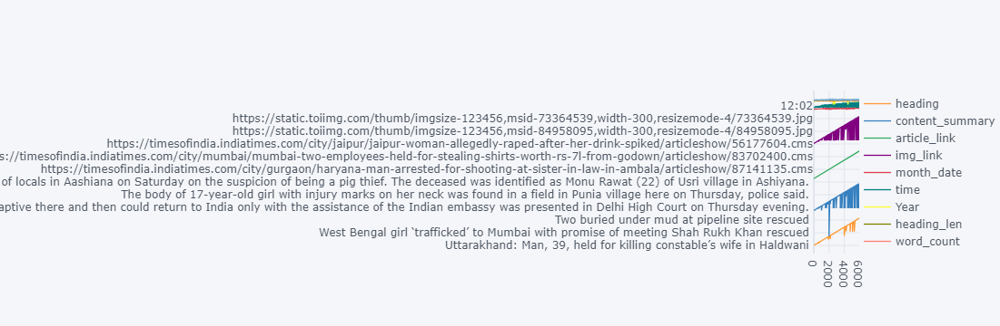

In [56]:
from plotly.offline import iplot
py.offline.init_notebook_mode(connected=True)
cf.go_offline()

df.iplot()

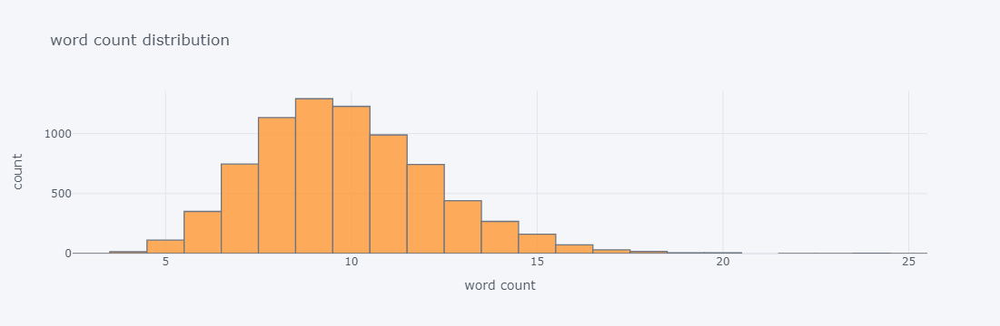

In [57]:
#  Visualizing our word_count column

df["word_count"].iplot(kind="hist",xTitle="word count",yTitle="count",title="word count distribution")

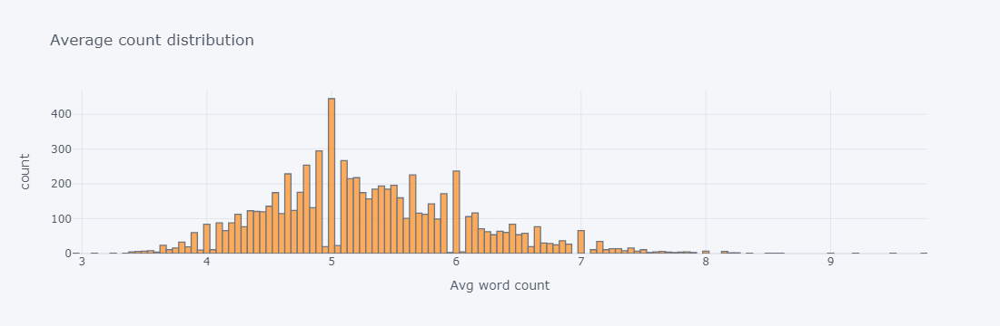

In [58]:
#Visualizing average word length

df["avg_word_len"].iplot(kind="hist",xTitle="Avg word count",yTitle="count",title="Average count distribution")

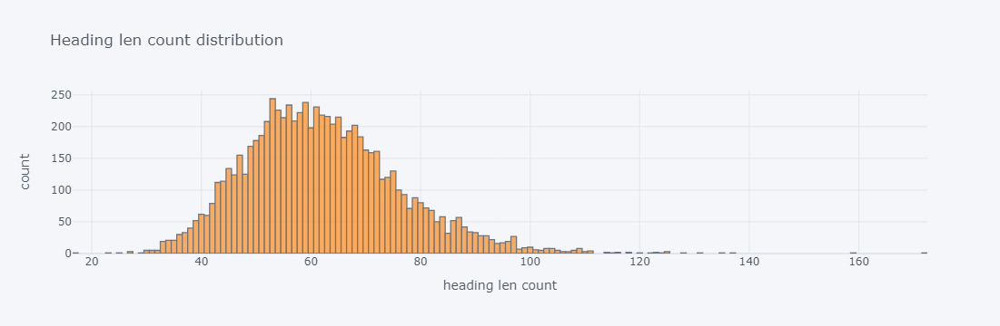

In [59]:
# Visualizing length of heading distribution

df["heading_len"].iplot(kind="hist",xTitle="heading len count",yTitle="count",title="Heading len count distribution")

In [60]:
 # converting heading column to lower case

df["heading"].str.lower()

0        uttarakhand: man, 39, held for killing consta...
1        nashik city: another theft from parked car, s...
2        pune: externed criminal jumps from bus fearin...
3        gaya woman burned alive on suspicion of witch...
4                 man held on charge of stalking in pune 
                              ...                        
7612     mumbai: borivli businessman duped of rs 1 lak...
7613     former new york governor cuomo accused of gro...
7614     delhi cop and neighbour injured in shooting; ...
7615     illegal granite mining in tn: ed tags assets ...
7616     pramod sawant asks goa police to ‘zero down’ ...
Name: heading, Length: 7617, dtype: object

In [61]:
#converting heading column to lower case

df["content_summary"].str.lower()

0        nainital district police on monday arrested a...
1        thefts from parked cars continues in the city...
2        an externed criminal died in the early hours ...
3        a middle-aged woman was badly thrashed and bu...
4        a man (33) was arrested on tuesday from khed ...
                              ...                        
7612     a smalltime businessman from borivli was dupe...
7613     the filing from the albany county sheriff's o...
7614     a policeman and his neighbour were shot at by...
7615     the enforcement directorate (ed) has told the...
7616     chief minister pramod sawant on friday held a...
Name: content_summary, Length: 7617, dtype: object

In [62]:
#Tag Removal operation

df['heading']=df['heading'].apply(remove_tags)

df["content_summary"]=df["content_summary"].apply(remove_tags)

df["heading"]

0        Uttarakhand: Man, 39, held for killing consta...
1        Nashik city: Another theft from parked car, s...
2        Pune: Externed criminal jumps from bus fearin...
3        Gaya woman burned alive on suspicion of witch...
4                 Man held on charge of stalking in Pune 
                              ...                        
7612     Mumbai: Borivli businessman duped of Rs 1 lak...
7613     Former New York governor Cuomo accused of gro...
7614     Delhi cop and neighbour injured in shooting; ...
7615     Illegal granite mining in TN: ED tags assets ...
7616     Pramod Sawant asks Goa police to ‘zero down’ ...
Name: heading, Length: 7617, dtype: object

In [63]:
df['heading']=df['heading'].apply(remove_punc)

df["content_summary"]=df["content_summary"].apply(remove_punc)

In [64]:
df["heading"]

0        Uttarakhand Man 39 held for killing constable...
1        Nashik city Another theft from parked car sev...
2        Pune Externed criminal jumps from bus fearing...
3        Gaya woman burned alive on suspicion of witch...
4                 Man held on charge of stalking in Pune 
                              ...                        
7612     Mumbai Borivli businessman duped of Rs 1 lakh...
7613     Former New York governor Cuomo accused of gro...
7614     Delhi cop and neighbour injured in shooting g...
7615     Illegal granite mining in TN ED tags assets w...
7616     Pramod Sawant asks Goa police to ‘zero down’ ...
Name: heading, Length: 7617, dtype: object

In [65]:
df["heading"]=df["heading"].apply(lambda x:x.lower())

In [66]:
# Converting headings into array
vectors=cv.fit_transform(df["heading"]).toarray()

In [67]:
#Getting shape of vector
vectors.shape

(7617, 5000)

In [68]:
vectors

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 1, 0, 0]], dtype=int64)

In [69]:
# Finding most commonly used 5000 words in our corpus

feature_names = cv.get_feature_names_out()

In [70]:
feature_names

array(['10', '100', '1000', ..., 'zero', 'zone', 'zubair'], dtype=object)

In [71]:
#Finding similarity between vectors

similarity=cosine_similarity(vectors)


In [72]:
# Acessing other similar element to "5th heading"
similarity[5]

array([0.        , 0.        , 0.23570226, ..., 0.        , 0.        ,
       0.        ])

In [73]:
#Recommendation Function

def recommend(tag):
    if not df[df["heading"]==tag].empty:
        try:
            heading_index=df[df["heading"]==tag].index[0]
            distances=similarity[heading_index]
            heading_list=sorted(list(enumerate(distances)),reverse=True,key=lambda x:x[1])[1:6]
        
            for i in heading_list:
                print(df.iloc[i[0]].heading)
        except IndexError:
            pass
    else:
        if not df_en[df_en["title"]==tag].empty:
            try:
                heading_index = df_en[df_en["title"]==tag].index[0]
                distances = similarity_en[heading_index]
                heading_list = sorted(list(enumerate(distances)), reverse=True, key=lambda x: x[1])[1:6]
    
                for i in heading_list:
                    print(df_en.iloc[i[0]].title)
            except IndexError:
                pass

In [74]:
df['heading'][5]

' pune victims of two street robberies team up chase  nab criminal '

In [75]:
#top 5 similar type of heading

recommend(' pune victims of two street robberies team up chase  nab criminal ')

 pune smartphones make for easy pickings as street crimes up 
 pune criminal held for robbery aide booked 
 pune cops nab cook for stealing valuables 
 ghaziabad cops chase 2 snatchers nab one after brief gunfight 
 pune arrested ‘raw’ agent is wanted criminal in bihar 


In [76]:
recommend('former google career coach shares a visual trick for figuring out what to do with your life')

bringing pokémon go to life on google cloud
how to get a job at google
life coach vs therapist learn the difference  tony robbins
why google app engine rocks a google engineers take
google connects bigquery to google drive and sheets


In [77]:
#top 5 similar type of heading

recommend('former google career coach shares a visual trick for figuring out what to do with your life')

bringing pokémon go to life on google cloud
how to get a job at google
life coach vs therapist learn the difference  tony robbins
why google app engine rocks a google engineers take
google connects bigquery to google drive and sheets


In [78]:
recommend(' pune victims of two street robberies team up chase  nab criminal ')

 pune smartphones make for easy pickings as street crimes up 
 pune criminal held for robbery aide booked 
 pune cops nab cook for stealing valuables 
 ghaziabad cops chase 2 snatchers nab one after brief gunfight 
 pune arrested ‘raw’ agent is wanted criminal in bihar 
